In [1]:
import numpy as np 
import pandas as pd 
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))



/kaggle/input/chest-xray-covid19-pneumonia/Data/test/PNEUMONIA/PNEUMONIA(3607).jpg
/kaggle/input/chest-xray-covid19-pneumonia/Data/test/PNEUMONIA/PNEUMONIA(3961).jpg
/kaggle/input/chest-xray-covid19-pneumonia/Data/test/PNEUMONIA/PNEUMONIA(3958).jpg
/kaggle/input/chest-xray-covid19-pneumonia/Data/test/PNEUMONIA/PNEUMONIA(3643).jpg
/kaggle/input/chest-xray-covid19-pneumonia/Data/test/PNEUMONIA/PNEUMONIA(4088).jpg
/kaggle/input/chest-xray-covid19-pneumonia/Data/test/PNEUMONIA/PNEUMONIA(3679).jpg
/kaggle/input/chest-xray-covid19-pneumonia/Data/test/PNEUMONIA/PNEUMONIA(3506).jpg
/kaggle/input/chest-xray-covid19-pneumonia/Data/test/PNEUMONIA/PNEUMONIA(4161).jpg
/kaggle/input/chest-xray-covid19-pneumonia/Data/test/PNEUMONIA/PNEUMONIA(4121).jpg
/kaggle/input/chest-xray-covid19-pneumonia/Data/test/PNEUMONIA/PNEUMONIA(3534).jpg
/kaggle/input/chest-xray-covid19-pneumonia/Data/test/PNEUMONIA/PNEUMONIA(3596).jpg
/kaggle/input/chest-xray-covid19-pneumonia/Data/test/PNEUMONIA/PNEUMONIA(3460).jpg
/kag

In [2]:
!pip install lime shap -q

In [3]:
import cv2
from tensorflow.keras.preprocessing.image import img_to_array
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout,  Flatten
from tensorflow.keras.optimizers import Adam
from PIL import Image
import cv2
import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image
import json
from tensorflow.keras.applications.vgg16 import preprocess_input
from lime import lime_image
import shap
from skimage.segmentation import mark_boundaries
from sklearn.metrics import confusion_matrix
import tensorflow as tf
from lime import lime_image
from lime.wrappers.scikit_image import SegmentationAlgorithm
from skimage.io import imread
from skimage.transform import resize
from skimage.segmentation import mark_boundaries
from fastai.vision.all import *
import shutil
import tensorflow as tf
from tensorflow.keras.applications import ResNet50, ResNet101
from tensorflow.keras.layers import Dense, Dropout, Flatten, BatchNormalization, Activation, GlobalAveragePooling2D, GlobalMaxPooling2D, Concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical

2025-05-03 00:12:13.120537: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746231133.461420      19 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746231133.538324      19 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [4]:
base_path = "/kaggle/input/feature-selelcted-dataset"
categories = ['normal', 'covid19', 'pneumonia']
image_size = (224, 224)

# Main

In [5]:
def load_images_from_folder(folder, label_name, images_list, labels_list):
    for filename in os.listdir(folder):
        file_path = os.path.join(folder, filename)
        img = cv2.imread(file_path)
        if img is not None:
            img = cv2.resize(img, image_size)
            images_list.append(img)
            labels_list.append(label_name)

In [6]:
train_path = os.path.join(base_path, 'train')
train_images, train_labels = [], []

for category in categories:
    category_path = os.path.join(train_path, category)
    print(f"Loading training data from {category_path}...")
    load_images_from_folder(category_path, category, train_images, train_labels)

Loading training data from /kaggle/input/feature-selelcted-dataset/train/normal...
Loading training data from /kaggle/input/feature-selelcted-dataset/train/covid19...
Loading training data from /kaggle/input/feature-selelcted-dataset/train/pneumonia...


In [7]:
test_path = os.path.join(base_path, 'test')
test_images, test_labels = [], []

for category in categories:
    category_path = os.path.join(test_path, category)
    print(f"Loading test data from {category_path}...")
    load_images_from_folder(category_path, category, test_images, test_labels)

Loading test data from /kaggle/input/feature-selelcted-dataset/test/normal...
Loading test data from /kaggle/input/feature-selelcted-dataset/test/covid19...
Loading test data from /kaggle/input/feature-selelcted-dataset/test/pneumonia...


In [8]:
train_images = np.array(train_images)
train_labels = np.array(train_labels)
test_images = np.array(test_images)
test_labels = np.array(test_labels)
train_labels_cat = np.array(train_labels)
test_labels_cat = np.array(test_labels)

In [9]:
train_images = train_images.astype('float32') / 255.0
test_images = test_images.astype('float32') / 255.0

In [10]:
train_labels[train_labels == "covid19"] = "Patient"
train_labels[train_labels == "normal"] = "Normal"
train_labels[train_labels == "pneumonia"] = "Patient"

In [11]:
test_labels[test_labels == "covid19"] = "Patient"
test_labels[test_labels == "normal"] = "Normal"
test_labels[test_labels == "pneumonia"] = "Patient"

In [12]:
label_mapping = {'Patient':0, 'Normal':1}

train_labels_int = np.array([label_mapping[label] for label in train_labels], dtype='int32')
test_labels_int = np.array([label_mapping[label] for label in test_labels], dtype='int32')

train_labels = tf.keras.utils.to_categorical(train_labels_int, num_classes=2).astype('float32')
test_labels = tf.keras.utils.to_categorical(test_labels_int, num_classes=2).astype('float32')

In [13]:
label_mapping = {'covid19': 0, 'pneumonia': 1,'normal': 2}

train_labels_int = np.array([label_mapping[label] for label in train_labels_cat], dtype='int32')
test_labels_int = np.array([label_mapping[label] for label in test_labels_cat], dtype='int32')

train_labels_c = tf.keras.utils.to_categorical(train_labels_int, num_classes=3).astype('float32')
test_labels_c = tf.keras.utils.to_categorical(test_labels_int, num_classes=3).astype('float32')

In [14]:
class_dict = {0:'Patient',
              1:'Normal',
         }



In [15]:
class_dict_c = {0:'COVID19',
              1:'NORMAL',
              2:'PNEUMONIA'}

# Step 1 Model to classify Normal or Patient

In [16]:
class AdaptiveConcatPool2D(tf.keras.layers.Layer):
    def __init__(self):
        super(AdaptiveConcatPool2D, self).__init__()
        self.avg_pool = GlobalAveragePooling2D()
        self.max_pool = GlobalMaxPooling2D()

    def call(self, inputs):
        avg_pooled = self.avg_pool(inputs)
        max_pooled = self.max_pool(inputs)
        return Concatenate()([avg_pooled, max_pooled])

In [17]:
base_model_50 = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

I0000 00:00:1746231180.880944      19 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1746231180.881757      19 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [18]:
base_model_50.trainable = False
x_50 = base_model_50.output
x = AdaptiveConcatPool2D()(x_50) 
x = Flatten()(x)
x = Dense(4096, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(256)(x)
x = BatchNormalization()(x)
x = Dense(2, activation='sigmoid')(x)
model = Model(inputs=base_model_50.input, outputs=x)

model.compile(optimizer=Adam(learning_rate=0.001),
              loss='binary_crossentropy',
              metrics=['accuracy'])


model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 230, 230, 3)    │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 56, 56, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 56, 56, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 56, 56, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 41,419,394 (158.00 MB)

 Trainable params: 17,831,170 (68.02 MB)

 Non-trainable params: 23,588,224 (89.98 MB)

In [19]:
batch_size = 32
epochs = 25

history = model.fit(
    train_images, train_labels,
    epochs=epochs,
    batch_size=batch_size,
    validation_data=(test_images, test_labels),
    verbose=1
)

Epoch 1/25


I0000 00:00:1746231197.476952      78 service.cc:148] XLA service 0x7fb31c04efe0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1746231197.478013      78 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1746231197.478046      78 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1746231198.865675      78 cuda_dnn.cc:529] Loaded cuDNN version 90300


 2/38 ━━━━━━━━━━━━━━━━━━━━ 3s 85ms/step - accuracy: 0.5000 - loss: 0.8518  

I0000 00:00:1746231204.368404      78 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


38/38 ━━━━━━━━━━━━━━━━━━━━ 34s 437ms/step - accuracy: 0.7088 - loss: 0.7547 - val_accuracy: 0.3344 - val_loss: 12.6983
Epoch 2/25
38/38 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - accuracy: 0.8400 - loss: 0.5746 - val_accuracy: 0.5066 - val_loss: 2.2403
Epoch 3/25
38/38 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - accuracy: 0.8531 - loss: 0.3949 - val_accuracy: 0.7947 - val_loss: 0.5332
Epoch 4/25
38/38 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - accuracy: 0.8925 - loss: 0.2867 - val_accuracy: 0.9272 - val_loss: 0.2501
Epoch 5/25
38/38 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - accuracy: 0.9022 - loss: 0.2694 - val_accuracy: 0.9205 - val_loss: 0.2914
Epoch 6/25
38/38 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - accuracy: 0.9379 - loss: 0.1923 - val_accuracy: 0.9437 - val_loss: 0.1897
Epoch 7/25
38/38 ━━━━━━━━━━━━━━━━━━━━ 4s 104ms/step - accuracy: 0.9481 - loss: 0.1547 - val_accuracy: 0.9470 - val_loss: 0.1760
Epoch 8/25
38/38 ━━━━━━━━━━━━━━━━━━━━ 4s 105ms/step - accuracy: 0.9417 - loss: 0.1948 - val_accuracy: 0.9503 - va

# Step 2 Model to Classify Normal, Covid19, Pneumonia

In [20]:
predictions = model.predict(train_images)

38/38 ━━━━━━━━━━━━━━━━━━━━ 12s 195ms/step


In [21]:
predicted_classes = np.argmax(predictions, axis=1)
predicted_labels = [class_dict[pred] for pred in predicted_classes]
np.unique(predicted_labels)

array(['Patient'], dtype='<U7')

In [22]:
patient_indices = np.where(np.array(predicted_labels) == 'Patient')[0]
patient_images = train_images[patient_indices]
patient_true_labels = train_labels_c[patient_indices] 

In [23]:
train_2_images = patient_images
train_2_labels = patient_true_labels

In [24]:
train_2_images2 = []
train_2_labels2 = []
c_covid = 0
c_p = 0
for i in range(len(train_2_images)):
    if np.argmax(train_2_labels[i]) == 0 or np.argmax(train_2_labels[i]) == 2:
        train_2_images2.append(train_2_images[i])
        train_2_labels2.append(train_2_labels[i])
        if np.argmax(train_2_labels[i]) == 0:
            c_covid +=1
        if np.argmax(train_2_labels[i]) == 2:
            c_p +=1
        
train_2_images2 = np.array(train_2_images2)
train_2_labels2 = np.array(train_2_labels2)

In [25]:
print("Count of Covid: ", c_covid )
print("Count of Pneuomonia: ", c_p)

Count of Covid:  401
Count of Pneuomonia:  402


In [26]:
train_2_labels2 = np.delete(train_2_labels2, 1, axis=1)
train_2_labels2

array([[0., 1.],
       [0., 1.],
       [0., 1.],
       ...,
       [1., 0.],
       [1., 0.],
       [1., 0.]], dtype=float32)

In [27]:
test_2_labels = []
test_2_images = []
c_covid = 0
c_p = 0
for i in range(len(test_labels_cat)):
    if test_labels_cat[i] == "covid19" or test_labels_cat[i] == "pneumonia":
        test_2_labels.append(test_labels_cat[i])
        test_2_images.append(test_images[i])
        if test_labels_cat[i] == "covid19":
            c_covid +=1
        if test_labels_cat[i] == "pneumonia":
            c_p +=1
test_2_labels = np.array(test_2_labels)
test_2_images = np.array(test_2_images)
        

In [28]:
print("Count of Covid: ", c_covid )
print("Count of Pneuomonia: ", c_p)

Count of Covid:  101
Count of Pneuomonia:  100


In [29]:
label_encoder = LabelEncoder()
test_2_labels_int = label_encoder.fit_transform(test_2_labels)

test_2_labels_cat = to_categorical(test_2_labels_int, num_classes=2)

In [30]:
class AdaptiveConcatPool2D(tf.keras.layers.Layer):
    def __init__(self):
        super(AdaptiveConcatPool2D, self).__init__()
        self.avg_pool = GlobalAveragePooling2D()
        self.max_pool = GlobalMaxPooling2D()

    def call(self, inputs):
        avg_pooled = self.avg_pool(inputs)
        max_pooled = self.max_pool(inputs)
        return Concatenate()([avg_pooled, max_pooled])

base_model_101 = ResNet101(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model_101.trainable = False

x = base_model_101.output
x = AdaptiveConcatPool2D()(x) 
x = Flatten()(x)
x = Dense(4096, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(256)(x)
x = BatchNormalization()(x)
x = Dense(2, activation='sigmoid')(x)  

model_2 = Model(inputs=base_model_101.input, outputs=x)

model_2.compile(optimizer=Adam(learning_rate=0.001),
                loss='binary_crossentropy',
                metrics=['accuracy'])

model_2.summary()



171446536/171446536 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 230, 230, 3)    │              0 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 56, 56, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 56, 56, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 56, 56, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)             

 Total params: 60,489,858 (230.75 MB)

 Trainable params: 17,831,170 (68.02 MB)

 Non-trainable params: 42,658,688 (162.73 MB)

In [31]:
batch_size = 32
epochs = 25

In [32]:
history_2 = model_2.fit(
    train_2_images2, train_2_labels2,
    epochs=epochs,
    batch_size=batch_size,
    validation_data=(test_2_images, test_2_labels_cat),
    verbose=1
)


Epoch 1/25
26/26 ━━━━━━━━━━━━━━━━━━━━ 47s 886ms/step - accuracy: 0.8198 - loss: 0.5794 - val_accuracy: 0.5970 - val_loss: 3.4486
Epoch 2/25
26/26 ━━━━━━━━━━━━━━━━━━━━ 5s 209ms/step - accuracy: 0.8690 - loss: 0.5589 - val_accuracy: 0.6070 - val_loss: 2.7894
Epoch 3/25
26/26 ━━━━━━━━━━━━━━━━━━━━ 6s 214ms/step - accuracy: 0.8761 - loss: 0.4582 - val_accuracy: 0.5821 - val_loss: 2.4532
Epoch 4/25
26/26 ━━━━━━━━━━━━━━━━━━━━ 6s 219ms/step - accuracy: 0.8634 - loss: 0.4145 - val_accuracy: 0.5572 - val_loss: 2.0105
Epoch 5/25
26/26 ━━━━━━━━━━━━━━━━━━━━ 6s 223ms/step - accuracy: 0.8452 - loss: 0.4085 - val_accuracy: 0.5572 - val_loss: 1.7375
Epoch 6/25
26/26 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.8920 - loss: 0.2875 - val_accuracy: 0.5522 - val_loss: 1.9294
Epoch 7/25
26/26 ━━━━━━━━━━━━━━━━━━━━ 6s 230ms/step - accuracy: 0.8946 - loss: 0.2590 - val_accuracy: 0.5323 - val_loss: 2.0800
Epoch 8/25
26/26 ━━━━━━━━━━━━━━━━━━━━ 6s 234ms/step - accuracy: 0.8984 - loss: 0.2817 - val_accuracy: 0

# Training and Validation Loss

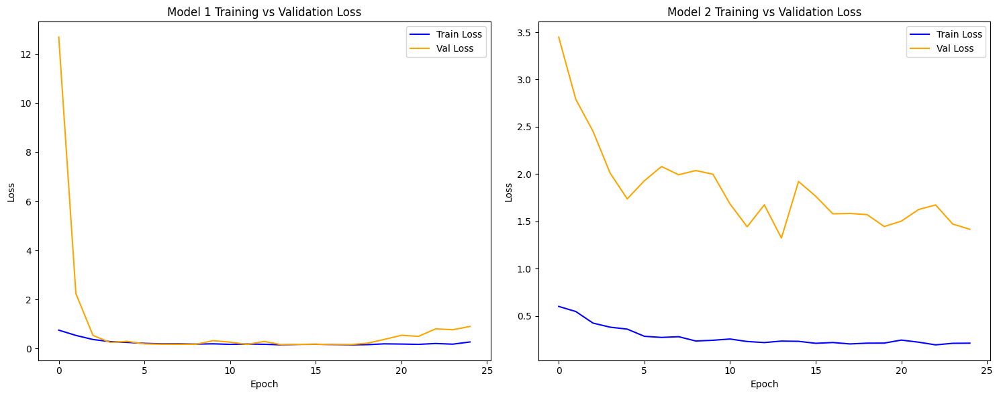

In [33]:
plt.figure(figsize=(15, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss', color='blue')
plt.plot(history.history['val_loss'], label='Val Loss', color='orange')
plt.title('Model 1 Training vs Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history_2.history['loss'], label='Train Loss', color='blue')
plt.plot(history_2.history['val_loss'], label='Val Loss', color='orange')
plt.title('Model 2 Training vs Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


# Training and Validation Accuracy

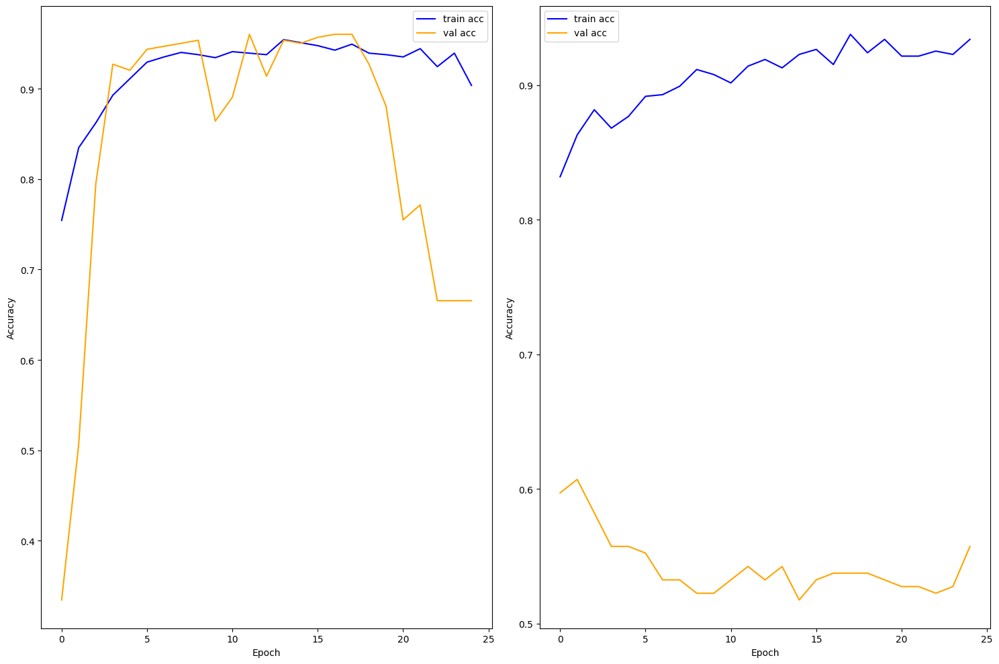

In [34]:
plt.figure(figsize=(15, 10))
plt.subplot(1, 2, 1)

plt.plot(history.history['accuracy'], label='train acc', color='blue')
plt.plot(history.history['val_accuracy'], label='val acc', color='orange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history_2.history['accuracy'], label='train acc', color='blue')
plt.plot(history_2.history['val_accuracy'], label='val acc', color='orange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


#  Confusion Matrix

10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 254ms/step


Text(0.5, 1.0, 'Confusion Matrix')

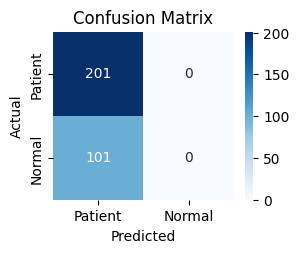

In [35]:
y_pred = model.predict(test_images)
y_pred_classes = np.argmax(y_pred, axis=1)

class_names = ['Patient', 'Normal']

true_classes = np.argmax(test_labels, axis=1)

cm = confusion_matrix(true_classes, y_pred_classes)


plt.subplot(2, 2, 3)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')

7/7 ━━━━━━━━━━━━━━━━━━━━ 16s 1s/step


Text(0.5, 1.0, 'Confusion Matrix')

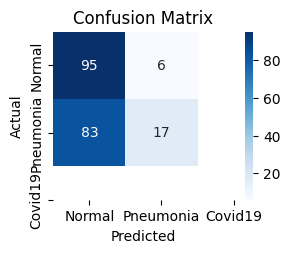

In [36]:
y_pred = model_2.predict(test_2_images)
y_pred_classes = np.argmax(y_pred, axis=1)

class_names = ['Normal', 'Pneumonia', 'Covid19']
true_classes = np.argmax(test_2_labels_cat, axis=1)

cm = confusion_matrix(true_classes, y_pred_classes)

plt.subplot(2, 2, 3)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')

# GRAD CAM

In [37]:
def gradCam(image, true_label, layer_conv_name, model, which):
    model_grad = tf.keras.models.Model(inputs=model.input, 
                                       outputs=[model.get_layer(layer_conv_name).output, 
                                                model.output])
    pred = []
    loss = None
    with tf.GradientTape() as tape:
        conv_output, predictions = model_grad(image)

        pred.append(np.argmax(predictions))
        
        tape.watch(conv_output)
        if which == "Categorical":
          loss = tf.keras.losses.categorical_crossentropy(true_label, predictions)
        else:
          loss = tf.losses.binary_crossentropy(true_label, predictions)
        
    
    grad = tape.gradient(loss, conv_output)
    grad = tf.reduce_mean(tf.abs(grad), axis=(0, 1, 2))
    
    conv_output = np.squeeze(conv_output.numpy())
    
    for i in range(conv_output.shape[-1]):
        conv_output[:, :, i] *= grad[i]
        
    heatmap = tf.reduce_mean(conv_output, axis=-1)
    heatmap = np.maximum(heatmap, 0)
    heatmap = heatmap / tf.reduce_max(heatmap + 1e-8)  
    heatmap = cv2.resize(heatmap.numpy(), (224, 224))
    pred = np.array(pred)
    return np.squeeze(heatmap), np.squeeze(image), pred

In [38]:
def getHeatMap(images, labels, model, which):
    heatmaps = []
    predictions = []
    for index in range(128):
        heatmap, image, pred = gradCam(images[index:index+1], 
                                 labels[index:index+1], 
                                 'conv5_block3_3_conv', model, which) 
        heatmaps.append(heatmap)
        predictions.append(pred)
    return np.array(heatmaps), predictions

# GRAD CAM with model for classifying Normal or Patient

In [39]:
heatmaps, pred = getHeatMap(test_images, test_labels, model, "Binary")
print(heatmaps.shape)

(128, 224, 224)


In [40]:
class_dict = {0:'patient',
              1:'normal',
         }

def draw(images, gradcam_heatmaps, labels, pred,  num_images=6):
    plt.figure(figsize=(12, 4 * num_images))
    for i in range(num_images):
        plt.subplot(num_images, 2, 2 * i + 1)
        plt.imshow(images[i])
        title_pred = class_dict[pred[i][0]]
        title_actual = class_dict[np.argmax(labels[i])]
        plt.title(f'Predicted: {title_pred}\nActual: {title_actual}')

  
        
        plt.axis('off')

        plt.subplot(num_images, 2, 2 * i + 2)
        plt.imshow(images[i])
        plt.imshow(gradcam_heatmaps[i], alpha=0.6, cmap='jet')
        plt.title('Grad-CAM')
        plt.axis('off')

    plt.tight_layout()
    plt.show()



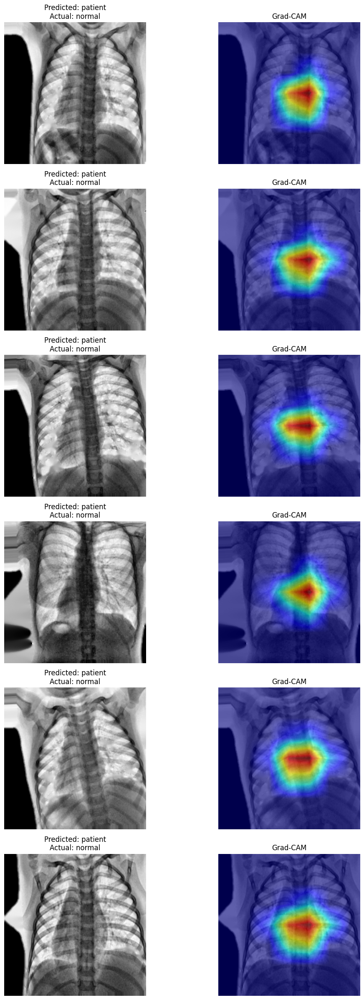

In [41]:
draw(test_images[:6], heatmaps[:6], test_labels[:6], pred)

# GRAD CAM with model for classifying Covid19 and Pneumonia

In [42]:
heatmaps, pred = getHeatMap(test_2_images, test_2_labels_cat, model_2, "Binary")
print(heatmaps.shape)

(128, 224, 224)


In [43]:
class_dict = {0:'Covid19',
              1:'Pneumonia',
         }

def draw(images, gradcam_heatmaps, labels, pred,  num_images=6):
    plt.figure(figsize=(12, 4 * num_images))
    for i in range(num_images):
        plt.subplot(num_images, 2, 2 * i + 1)
        plt.imshow(images[i])
        title_pred = class_dict[pred[i][0]]
        title_actual = class_dict[np.argmax(labels[i])]
        plt.title(f'Predicted: {title_pred}\nActual: {title_actual}')

  
        
        plt.axis('off')

        plt.subplot(num_images, 2, 2 * i + 2)
        plt.imshow(images[i])
        plt.imshow(gradcam_heatmaps[i], alpha=0.6, cmap='jet')
        plt.title('Grad-CAM')
        plt.axis('off')

    plt.tight_layout()
    plt.show()



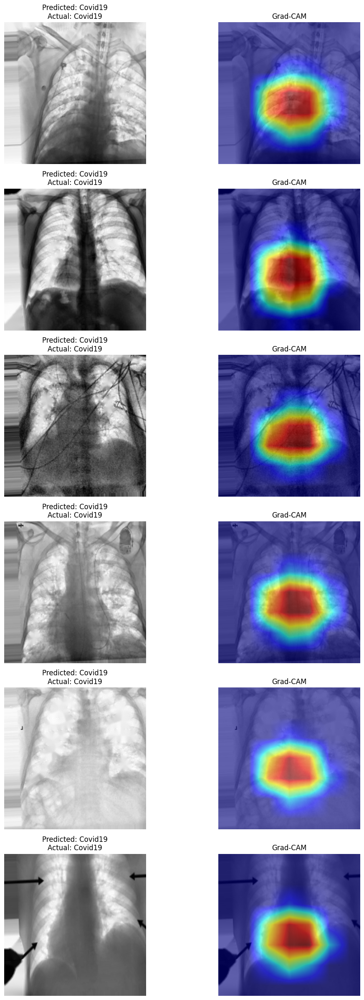

In [44]:
draw(test_2_images[:6], heatmaps[:6], test_2_labels_cat[:6], pred)

# Explainability with Lime

# LIME with model for classifying Normal or Patient

In [45]:
class_labels = ["Normal", "Patient"]

In [46]:
def predict_fn(images):
    images = np.array(images)
    if images.shape[-1] != 3:
        images = np.repeat(images, 3, axis=-1)
    images = np.clip(images, 0, 1)
    return model.predict(images, verbose=0)

In [47]:
def explain_with_lime_from_array(model, images, labels, class_labels, num_samples=3):
    explainer = lime_image.LimeImageExplainer()
    segmenter = SegmentationAlgorithm('quickshift', kernel_size=2, max_dist=100, ratio=0.2)

    for idx in range(num_samples):
        img = images[idx]
        label = labels[idx]

        img_normalized = img / 255.0 if img.max() > 1 else img

        try:
            explanation = explainer.explain_instance(
                img_normalized,
                predict_fn,
                top_labels=3,
                hide_color=None,
                num_samples=500,
                segmentation_fn=segmenter
            )
        except Exception as e:
            print(f"Error explaining image at index {idx}: {e}")
            continue

        pred = model.predict(np.expand_dims(img_normalized, axis=0), verbose=0)
        predicted_class = class_labels[np.argmax(pred)]

        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))

        img_viz = img if img.shape[-1] == 3 else np.stack([img.squeeze()] * 3, axis=-1)
        ax1.imshow(img_viz.astype(np.float32))
        ax1.set_title(f'True: {class_labels[np.argmax(label)]}\nPredicted: {predicted_class}')

        ax1.axis('off')

        temp, mask = explanation.get_image_and_mask(
            explanation.top_labels[0],
            positive_only=True,
            num_features=5,
            hide_rest=False
        )

        overlay = np.zeros_like(img_viz)
        overlay[mask == 1] = [1, 0, 0]
        alpha = 0.3
        highlighted_image = (1 - alpha) * img_viz + alpha * overlay
        highlighted_image = np.clip(highlighted_image, 0, 1)

        highlighted_image = mark_boundaries(highlighted_image, mask, color=(1, 0, 0), mode='thick')
        ax2.imshow(highlighted_image)
        ax2.set_title('LIME Highlights')
        ax2.axis('off')

        plt.tight_layout()
        plt.show()

        print(f"Image Index: {idx}")
        print(f"Predicted probabilities: {dict(zip(class_labels, pred[0]))}\n")


  0%|          | 0/500 [00:00<?, ?it/s]

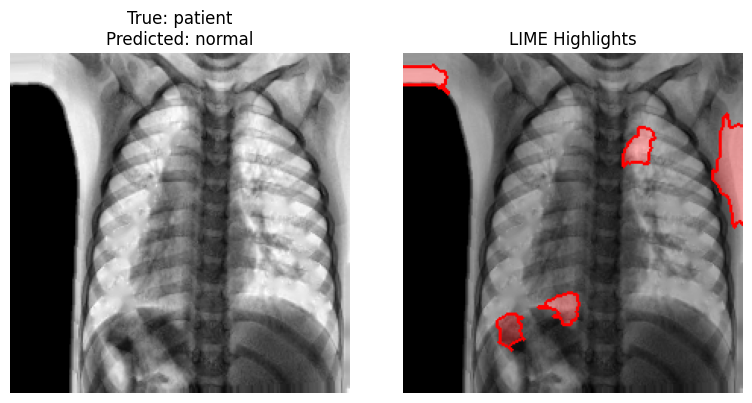

Image Index: 0
Predicted probabilities: {'normal': 0.93525624, 'patient': 0.068478994}



  0%|          | 0/500 [00:00<?, ?it/s]

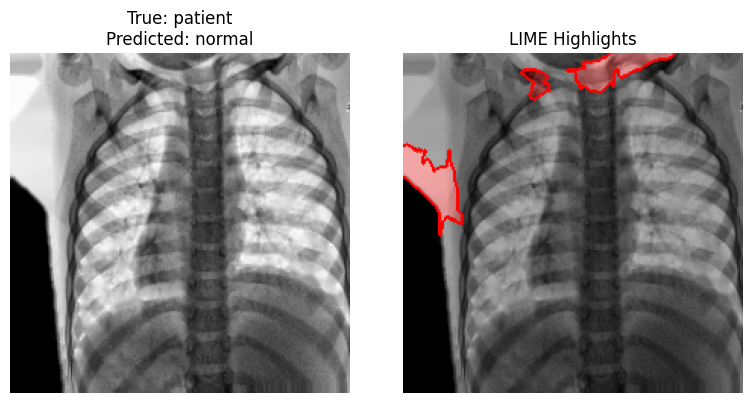

Image Index: 1
Predicted probabilities: {'normal': 0.9245438, 'patient': 0.080099314}



  0%|          | 0/500 [00:00<?, ?it/s]

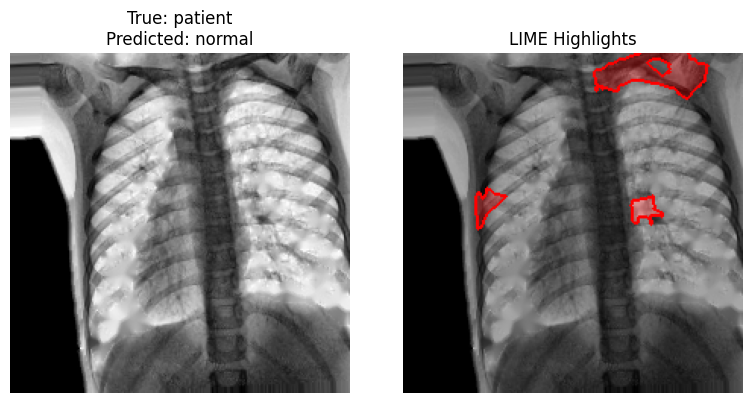

Image Index: 2
Predicted probabilities: {'normal': 0.92478347, 'patient': 0.08001702}



In [48]:
class_labels = ['normal', 'patient']

explain_with_lime_from_array(model, test_images, test_labels, class_labels)


# LIME with model for classifying Normal or Covid19 or Pneumonia

In [49]:
def preprocess_image(image_path):
    try:
        img = imread(image_path, as_gray=False)
        img = resize(img, (224, 224), anti_aliasing=True)
        if len(img.shape) == 2:
            img_rgb = np.stack([img] * 3, axis=-1)
        elif img.shape[-1] == 1:
            img_rgb = np.repeat(img, 3, axis=-1)
        else:
            img_rgb = img
        img_normalized = img_rgb / 255.0 if img_rgb.max() > 1 else img_rgb
        if len(img.shape) == 2 or (len(img.shape) == 3 and np.all(img[:, :, 0] == img[:, :, 1]) and np.all(img[:, :, 1] == img[:, :, 2])):
            img_viz = img if len(img.shape) == 2 else img[:, :, 0]
        else:
            img_viz = img_rgb
        return img_normalized, img_viz
    except Exception as e:
        print(f"Error preprocessing image: {e}")
        return None, None

In [50]:
def predict_fn(images):
    images = np.array(images)
    if images.shape[-1] != 3:
        images = np.repeat(images, 3, axis=-1)
    images = np.clip(images, 0, 1)
    return model_2.predict(images, verbose=0)

In [51]:
def explain_with_lime(model, image_paths_with_labels):
    explainer = lime_image.LimeImageExplainer()
    segmenter = SegmentationAlgorithm('quickshift', kernel_size=2, max_dist=100, ratio=0.2)

    for image_path, class_name in image_paths_with_labels:
        img_normalized, img_viz = preprocess_image(image_path)
        if img_normalized is None:
            print(f"Skipping {image_path} due to preprocessing error.")
            continue

        try:
            explanation = explainer.explain_instance(
                img_normalized,
                predict_fn,
                top_labels=3,
                hide_color=None,
                num_samples=500,
                segmentation_fn=segmenter
            )
        except Exception as e:
            print(f"Error explaining image {image_path}: {e}")
            continue

        pred = model.predict(np.expand_dims(img_normalized, axis=0), verbose=0)
        predicted_class = class_labels[np.argmax(pred)]

        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))

        ax1.imshow(img_viz, cmap='gray' if len(img_viz.shape) == 2 else None)
        ax1.set_title(f'Original ({class_name})\nPredicted: {predicted_class}')
        ax1.axis('off')

        temp, mask = explanation.get_image_and_mask(
            explanation.top_labels[0],
            positive_only=True,
            num_features=5,
            hide_rest=False
        )

        base_image = img_viz
        if len(base_image.shape) == 2:
            overlay = np.zeros_like(base_image)
            overlay[mask == 1] = 1
            alpha = 0.3
            highlighted_image = (1 - alpha) * base_image + alpha * overlay
            highlighted_image = np.clip(highlighted_image, 0, 1)
            cmap = 'gray'
        else:
            overlay = np.zeros_like(base_image)
            overlay[mask == 1] = [1, 0, 0]
            alpha = 0.3
            highlighted_image = (1 - alpha) * base_image + alpha * overlay
            highlighted_image = np.clip(highlighted_image, 0, 1)
            cmap = None

        highlighted_image = mark_boundaries(highlighted_image, mask, color=(1, 0, 0), mode='thick')
        ax2.imshow(highlighted_image, cmap=cmap)
        ax2.set_title('LIME Highlights')
        ax2.axis('off')

        plt.tight_layout()
        plt.show()

        print(f"Image: {image_path}")
        print(f"Predicted probabilities: {dict(zip(class_labels, pred[0]))}\n")

  0%|          | 0/500 [00:00<?, ?it/s]

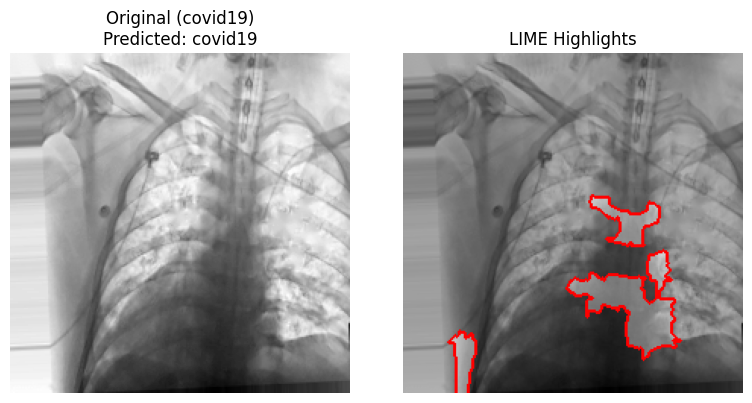

Image: /kaggle/input/feature-selelcted-dataset/test/covid19/image_253.png
Predicted probabilities: {'covid19': 0.99179274, 'normal': 0.014683731}



  0%|          | 0/500 [00:00<?, ?it/s]

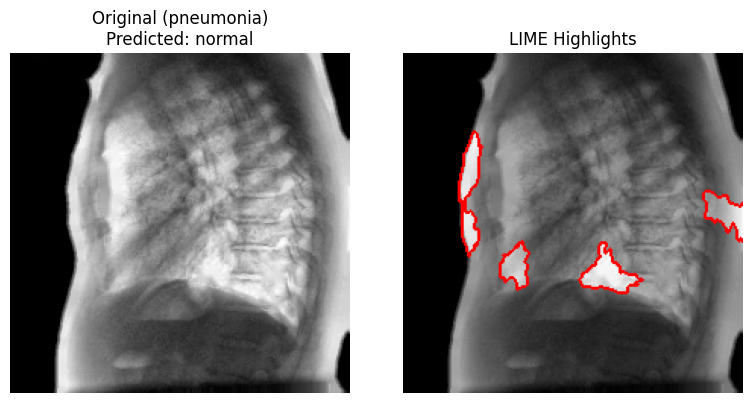

Image: /kaggle/input/feature-selelcted-dataset/test/pneumonia/image_281.png
Predicted probabilities: {'covid19': 0.22712305, 'normal': 0.7825289}



  0%|          | 0/500 [00:00<?, ?it/s]

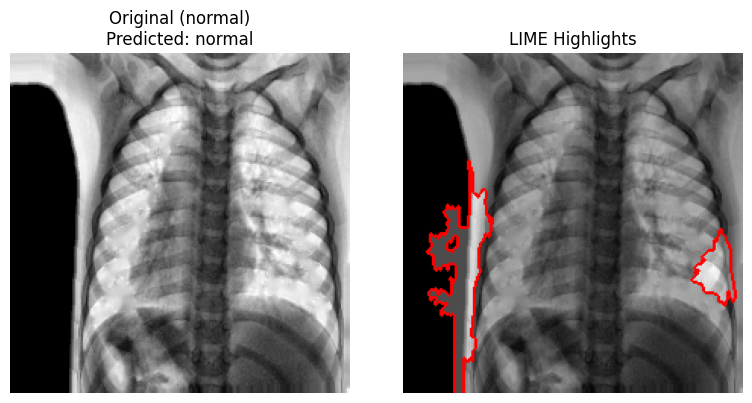

Image: /kaggle/input/feature-selelcted-dataset/test/normal/image_301.png
Predicted probabilities: {'covid19': 0.0015620424, 'normal': 0.99782556}



In [52]:
class_labels = ['covid19', 'normal', 'pneumonia']
test_dir = '/kaggle/input/feature-selelcted-dataset/test'
try:
    image_paths = [
        (os.path.join(test_dir, 'covid19', os.listdir(os.path.join(test_dir, 'covid19'))[0]), 'covid19'),
        (os.path.join(test_dir, 'pneumonia', os.listdir(os.path.join(test_dir, 'pneumonia'))[0]), 'pneumonia'),
        (os.path.join(test_dir, 'normal', os.listdir(os.path.join(test_dir, 'normal'))[0]), 'normal')
    ]
    explain_with_lime(model_2, image_paths)
except Exception as e:
    print(f"Error loading sample images: {e}")

# DeepLift

# LIME with model for classifying Normal or Patient

In [53]:
def deeplift(model, img, baseline=None, pred_index=None):
    if baseline is None:
        baseline = np.zeros_like(img)
    img = tf.convert_to_tensor(img, dtype=tf.float32)
    baseline = tf.convert_to_tensor(baseline, dtype=tf.float32)
    
    diff = img - baseline
    
    with tf.GradientTape() as tape:
        tape.watch(img)
        preds = model(img)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        score = preds[:, pred_index]
    
    grads = tape.gradient(score, img)
    
    multipliers = grads
    
    contributions = diff * multipliers
    
    heatmap = tf.reduce_sum(tf.abs(contributions), axis=-1).numpy()
    heatmap = np.maximum(heatmap, 0) / (np.max(heatmap) + 1e-10)  
    return heatmap, pred_index

In [54]:
def display_heatmap(img, heatmap, alpha=0.5):
    if img.ndim == 4:
        img = img[0]
    if heatmap.ndim == 3:
        heatmap = heatmap[0]
    
    img = np.uint8(255 * (img - img.min()) / (img.max() - img.min() + 1e-10))
    
    heatmap = np.uint8(255 * heatmap)
    heatmap = tf.image.resize(heatmap[..., np.newaxis], (img.shape[0], img.shape[1])).numpy()[..., 0]
    heatmap = np.uint8(plt.cm.jet(heatmap)[..., :3] * 255)
    
    superimposed_img = heatmap * alpha + img * (1 - alpha)
    return np.uint8(superimposed_img)

In [55]:
# Select 3 samples per class
num_classes = 2
samples_per_class = 2
class_indices = np.argmax(test_labels, axis=1)

selected_images = []
selected_labels = []

for class_idx in range(num_classes):
    class_samples = np.where(class_indices == class_idx)[0]
    if len(class_samples) < samples_per_class:
        print(f"Warning: Class {class_idx} has only {len(class_samples)} samples, using all available.")
        selected_samples = class_samples
    else:
        selected_samples = np.random.choice(class_samples, size=samples_per_class, replace=False)
    
    selected_images.extend(test_images[selected_samples])
    selected_labels.extend(test_labels[selected_samples])

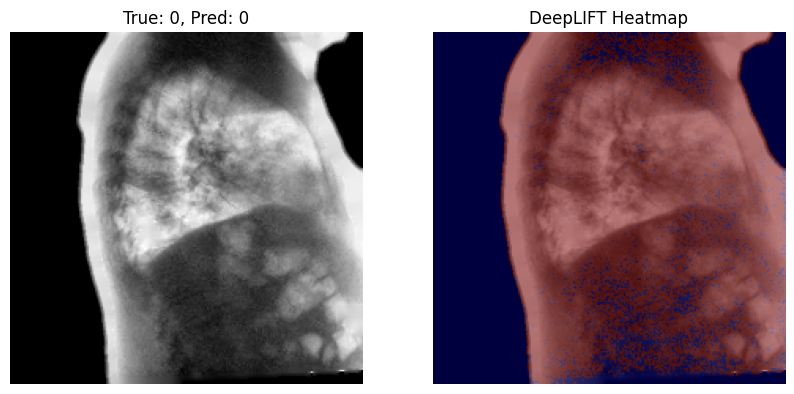

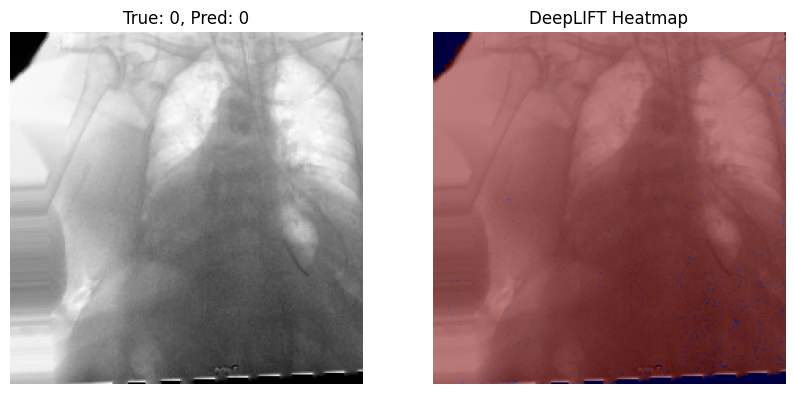

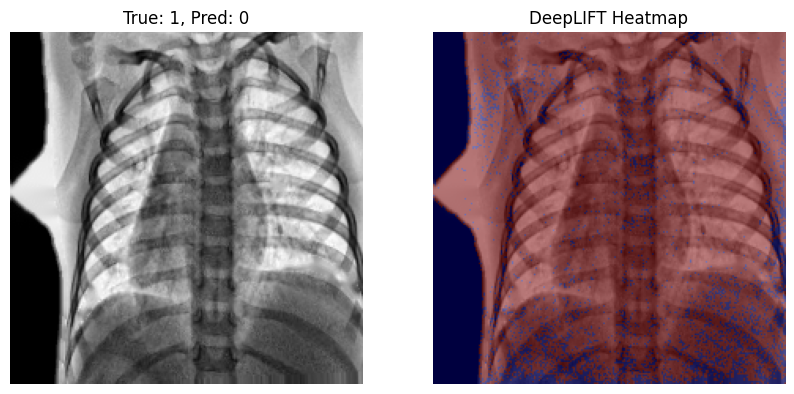

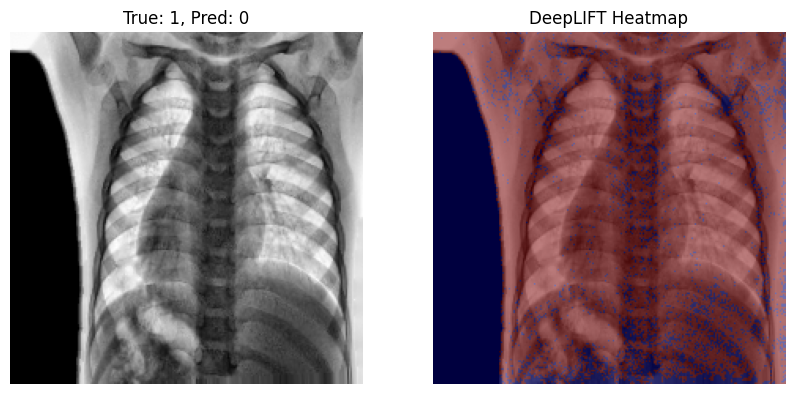

In [56]:
sample_images = np.array(selected_images)
sample_labels = np.array(selected_labels)

for i in range(len(sample_images)):
    img = sample_images[i:i+1]
    true_label = np.argmax(sample_labels[i])
    
    heatmap, pred_class = deeplift(model, img)
    
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(img[0])
    plt.title(f"True: {true_label}, Pred: {pred_class}")
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    superimposed_img = display_heatmap(img, heatmap)
    plt.imshow(superimposed_img)
    plt.title("DeepLIFT Heatmap")
    plt.axis('off')
    
    plt.show()

# LIME with model for classifying Normal or Covid19 or Pneumonia

In [57]:
# Select 3 samples per class
num_classes = 2
samples_per_class = 2
class_indices = np.argmax(test_2_labels_cat, axis=1)

selected_images = []
selected_labels = []

for class_idx in range(num_classes):
    class_samples = np.where(class_indices == class_idx)[0]
    if len(class_samples) < samples_per_class:
        print(f"Warning: Class {class_idx} has only {len(class_samples)} samples, using all available.")
        selected_samples = class_samples
    else:
        selected_samples = np.random.choice(class_samples, size=samples_per_class, replace=False)
    
    selected_images.extend(test_2_images[selected_samples])
    selected_labels.extend(test_2_labels_cat[selected_samples])

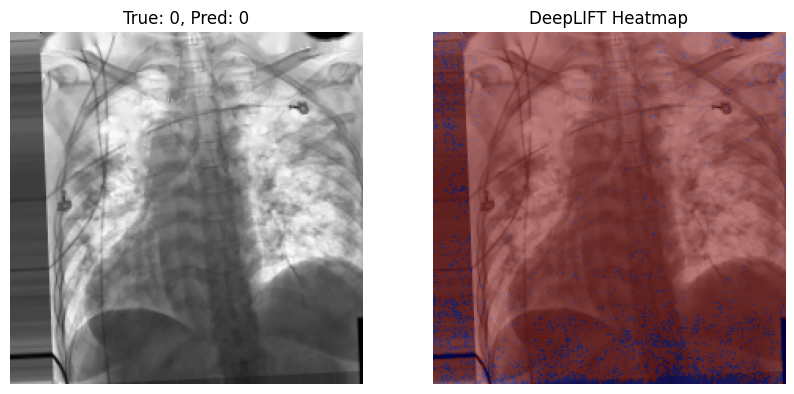

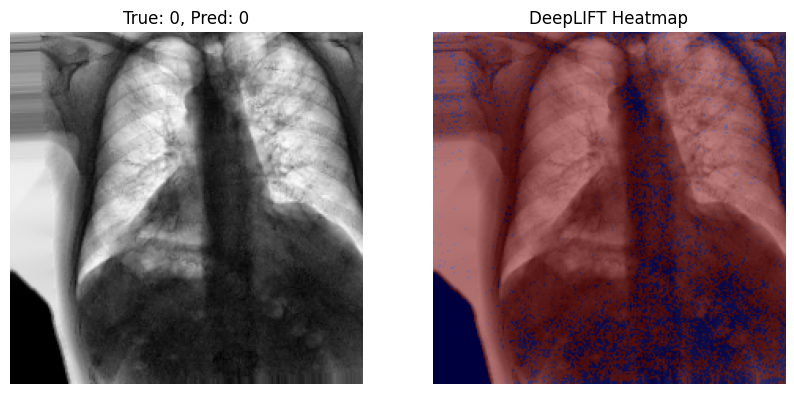

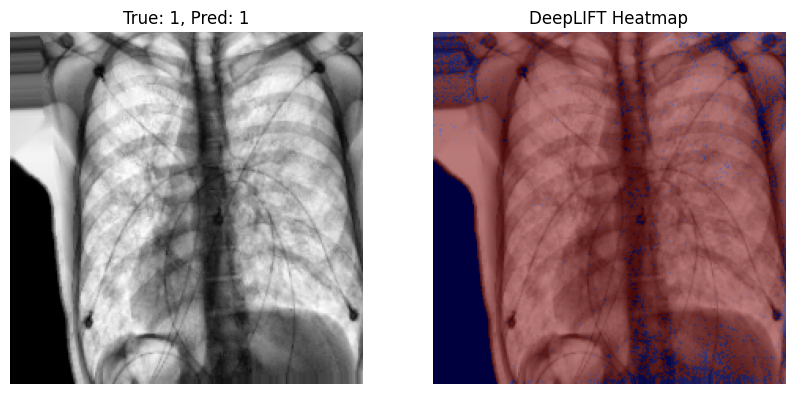

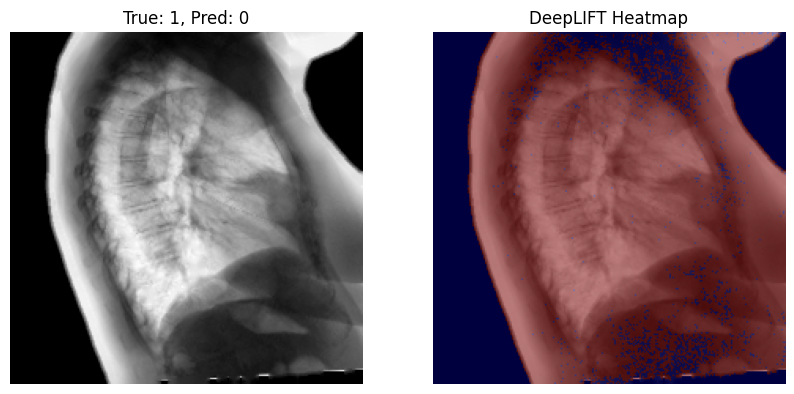

In [58]:
sample_images = np.array(selected_images)
sample_labels = np.array(selected_labels)

for i in range(len(sample_images)):
    img = sample_images[i:i+1]
    true_label = np.argmax(sample_labels[i])
    
    heatmap, pred_class = deeplift(model_2, img)
    
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(img[0])
    plt.title(f"True: {true_label}, Pred: {pred_class}")
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    superimposed_img = display_heatmap(img, heatmap)
    plt.imshow(superimposed_img)
    plt.title("DeepLIFT Heatmap")
    plt.axis('off')
    
    plt.show()

# Permutation Importance

In [59]:
class_names = ['Patient', 'Normal']

class_indices = {}
for i in range(len(test_2_labels_cat)):
    true_label = np.argmax(test_2_labels_cat[i])
    if true_label not in class_indices:
        class_indices[true_label] = i
    if len(class_indices) == 2:
        break

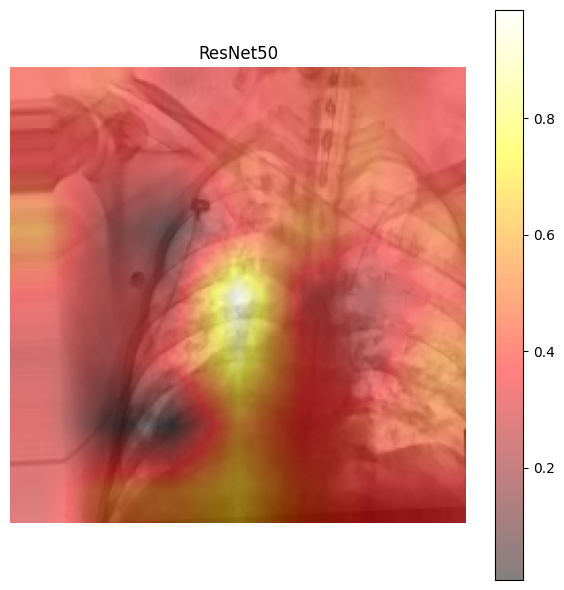

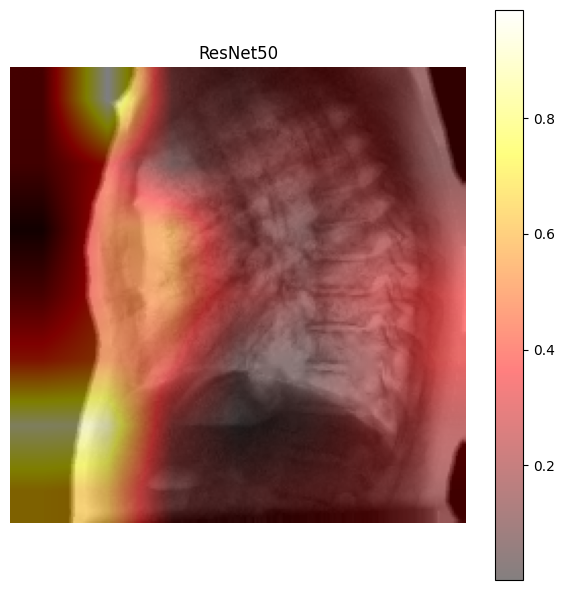

In [60]:
img_patient = test_2_images[class_indices[0]]
img_normal = test_2_images[class_indices[1]]


def permutation_importance(image, model, class_index, model_name, raw_image, patch_size=32):
    image = np.expand_dims(image, axis=0)
    correct_prob = model.predict(image, verbose=0)[0, class_index]

    h, w = image.shape[1], image.shape[2]
    importance_map = np.zeros((h // patch_size, w // patch_size))

    for i in range(0, h, patch_size):
        for j in range(0, w, patch_size):
            permuted = image.copy()

            for c in range(3):
                permuted[0, i:i+patch_size, j:j+patch_size, c] = np.random.rand(patch_size, patch_size)

            pred_prob = model.predict(permuted, verbose=0)[0, class_index]
            importance = correct_prob - pred_prob
            importance_map[i // patch_size, j // patch_size] = importance

    importance_map = (importance_map - importance_map.min()) / (importance_map.max() - importance_map.min() + 1e-8)

    heatmap = cv2.resize(importance_map, (w, h))

    plt.figure(figsize=(6, 6))
    plt.imshow(raw_image)
    plt.imshow(heatmap, cmap='hot', alpha=0.5)
    plt.title(f"{model_name}")
    plt.axis('off')
    plt.colorbar()
    plt.tight_layout()
    plt.show()

permutation_importance(img_patient, model_2, class_index=0, model_name="ResNet50", raw_image=img_patient)
permutation_importance(img_normal, model_2, class_index=1, model_name="ResNet50", raw_image=img_normal)

In [61]:
class_names = ['Covid19', 'Pneumonia']

class_indices = {}
for i in range(len(test_labels)):
    true_label = np.argmax(test_labels[i])
    if true_label not in class_indices:
        class_indices[true_label] = i
    if len(class_indices) == 2:
        break

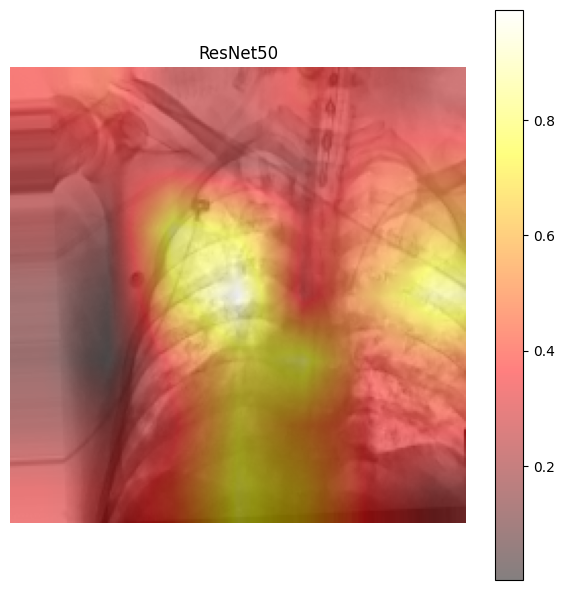

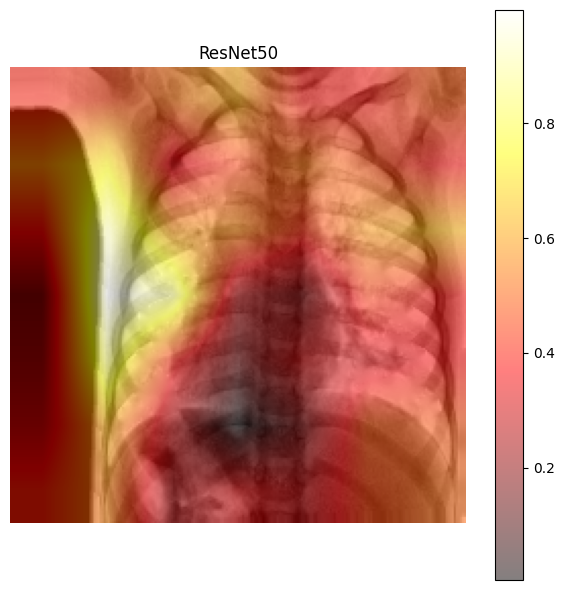

In [62]:
img_patient = test_images[class_indices[0]]
img_normal = test_images[class_indices[1]]


def permutation_importance(image, model, class_index, model_name, raw_image, patch_size=32):
    image = np.expand_dims(image, axis=0)
    correct_prob = model.predict(image, verbose=0)[0, class_index]

    h, w = image.shape[1], image.shape[2]
    importance_map = np.zeros((h // patch_size, w // patch_size))

    for i in range(0, h, patch_size):
        for j in range(0, w, patch_size):
            permuted = image.copy()

            for c in range(3):
                permuted[0, i:i+patch_size, j:j+patch_size, c] = np.random.rand(patch_size, patch_size)

            pred_prob = model.predict(permuted, verbose=0)[0, class_index]
            importance = correct_prob - pred_prob
            importance_map[i // patch_size, j // patch_size] = importance

    importance_map = (importance_map - importance_map.min()) / (importance_map.max() - importance_map.min() + 1e-8)

    heatmap = cv2.resize(importance_map, (w, h))

    plt.figure(figsize=(6, 6))
    plt.imshow(raw_image)
    plt.imshow(heatmap, cmap='hot', alpha=0.5)
    plt.title(f"{model_name}")
    plt.axis('off')
    plt.colorbar()
    plt.tight_layout()
    plt.show()

permutation_importance(img_patient, model, class_index=0, model_name="ResNet50", raw_image=img_patient)
permutation_importance(img_normal, model, class_index=1, model_name="ResNet50", raw_image=img_normal)